Necesitarás instalar las librerías y versiones correspondientes para ejecutar este archivo Jupyter. Las dependencias se encuentran en el archivo "requirements.txt". Puedes usar el comando:

!pip install -r requirements.txt

In [2]:
import pandas as pd
import ydata_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar el CSV con los datos
df = pd.read_csv('TWO_CENTURIES_OF_UM_RACES.csv')

# Mostrar los primeros 10 registros del dataset para un primer vistazo
df.head(10)

<ipython-input-2-8742f2078d8a>:7: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('TWO_CENTURIES_OF_UM_RACES.csv')


,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID
0,2018,06.01.2018,Selva Costera (CHI),50km,22,4:51:39 h,Tnfrc,CHI,1978.0,M,M35,10.286,0
1,2018,06.01.2018,Selva Costera (CHI),50km,22,5:15:45 h,Roberto Echeverría,CHI,1981.0,M,M35,9.501,1
2,2018,06.01.2018,Selva Costera (CHI),50km,22,5:16:44 h,Puro Trail Osorno,CHI,1987.0,M,M23,9.472,2
3,2018,06.01.2018,Selva Costera (CHI),50km,22,5:34:13 h,Columbia,ARG,1976.0,M,M40,8.976,3
4,2018,06.01.2018,Selva Costera (CHI),50km,22,5:54:14 h,Baguales Trail,CHI,1992.0,M,M23,8.469,4
5,2018,06.01.2018,Selva Costera (CHI),50km,22,6:25:01 h,NaN,ARG,1974.0,M,M40,7.792,5
6,2018,06.01.2018,Selva Costera (CHI),50km,22,6:28:00 h,Los Patagones,ARG,1979.0,F,W35,7.732,6
7,2018,06.01.2018,Selva Costera (CHI),50km,22,6:32:24 h,Reaktiva Chile,CHI,1967.0,F,W50,7.645,7
8,2018,06.01.2018,Selva Costera (CHI),50km,22,6:39:08 h,Puro Trail Osorno,CHI,1985.0,M,M23,7.516,8
9,2018,06.01.2018,Selva Costera (CHI),50km,22,6:45:11 h,Marlene Flores Team,CHI,1976.0,M,M40,7.404,9


Solo queremos los datos de las carreras en EEUU de 50km/50mi de distancia y durante el año 2020.

Exploramos el dataset para responder a las siguientes cuestiones:
1. Diferencia de velocidad en las carreras "50km" y "50mi" entre mujeres y hombres.
2. ¿Qué edades son las mejores y peores en la carrera "50mi"? (Solo personas mayores de 19 años).
3. ¿Son los corredores más lentos en verano que en invierno? Ver diferencia entre estaciones.

Se harán observaciones extras para sacar relaciones u otras conclusiones.


In [ ]:
# Perfil del dataset para explorar los datos

pp.ProfileReport(df, explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [03:35<00:00, 16.54s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
# Tipo de dato de cada columna

df.dtypes

,0
Year of event,int64
Event dates,object
Event name,object
Event distance/length,object
Event number of finishers,int64
Athlete performance,object
Athlete club,object
Athlete country,object
Athlete year of birth,float64
Athlete gender,object


In [4]:
# Limpieza de datos

df_filtered = df[(df['Event distance/length'].isin(['50mi', '50km'])) & (df['Year of event'] == 2020) & (df['Event name'].str.split('(').str.get(1).str.split(')').str.get(0) == 'USA')]

df_filtered.head(8)

,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID
2539945,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,3:17:55 h,"*Normandy Park, WA",USA,1991.0,M,M23,15.158,71287
2539946,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:02:32 h,"*Gold Bar, WA",USA,1981.0,M,M35,12.369,629508
2539947,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:07:57 h,"*Vashon, WA",USA,1999.0,M,MU23,12.099,64838
2539948,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:22:02 h,"*Gig Harbor, WA",USA,1983.0,M,M35,11.449,704450
2539949,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:27:34 h,"*Bainbridge Island, WA",USA,1977.0,M,M40,11.212,810281
2539950,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:42:06 h,"*Seattle, WA",USA,1985.0,F,W23,10.635,810282
2539951,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:49:20 h,"*Camano Island, WA",USA,1961.0,M,M55,10.369,11739
2539952,2020,02.02.2020,West Seattle Beach Run - Winter Edition (USA),50km,20,4:49:50 h,"*Clinton, WA",USA,1970.0,M,M45,10.351,80394


In [5]:
num_filas, num_columnas = df_filtered.shape
print(f"Número de columnas: {num_columnas}. Número de registros: {num_filas}")

Número de columnas: 13. Número de registros: 26090


In [6]:
# Eliminamos la cadena "(USA)" de "Event name"

df_filtered['Event name'] = df_filtered['Event name'].str.split('(').str.get(0)

df_filtered.head(8)

<ipython-input-6-535695e1632e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Event name'] = df_filtered['Event name'].str.split('(').str.get(0)


,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID
2539945,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,3:17:55 h,"*Normandy Park, WA",USA,1991.0,M,M23,15.158,71287
2539946,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:02:32 h,"*Gold Bar, WA",USA,1981.0,M,M35,12.369,629508
2539947,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:07:57 h,"*Vashon, WA",USA,1999.0,M,MU23,12.099,64838
2539948,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:22:02 h,"*Gig Harbor, WA",USA,1983.0,M,M35,11.449,704450
2539949,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:27:34 h,"*Bainbridge Island, WA",USA,1977.0,M,M40,11.212,810281
2539950,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:42:06 h,"*Seattle, WA",USA,1985.0,F,W23,10.635,810282
2539951,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:49:20 h,"*Camano Island, WA",USA,1961.0,M,M55,10.369,11739
2539952,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:49:50 h,"*Clinton, WA",USA,1970.0,M,M45,10.351,80394


In [7]:
# Cambiamos la categoría de atletas por año por el año real del atleta

df_filtered['Athlete age'] = 2020 - df_filtered['Athlete year of birth']

<ipython-input-7-17d4731eda46>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Athlete age'] = 2020 - df_filtered['Athlete year of birth']


In [8]:
# Quitamos el carácter "h" de "Athlete performance"

df_filtered['Athlete performance'] = df_filtered['Athlete performance'].str.split(' ').str.get(0)

df_filtered.head(5)

<ipython-input-8-264d7cf6ec34>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Athlete performance'] = df_filtered['Athlete performance'].str.split(' ').str.get(0)


,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID,Athlete age
2539945,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,3:17:55,"*Normandy Park, WA",USA,1991.0,M,M23,15.158,71287,29.0
2539946,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:02:32,"*Gold Bar, WA",USA,1981.0,M,M35,12.369,629508,39.0
2539947,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:07:57,"*Vashon, WA",USA,1999.0,M,MU23,12.099,64838,21.0
2539948,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:22:02,"*Gig Harbor, WA",USA,1983.0,M,M35,11.449,704450,37.0
2539949,2020,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:27:34,"*Bainbridge Island, WA",USA,1977.0,M,M40,11.212,810281,43.0


In [9]:
# Nos deshacemos de la columna "Year of event", "Athlete club", "Athlete country", "Athlete age category" y "Athlete year of birth"

df_filtered = df_filtered.drop(['Year of event', 'Athlete club', 'Athlete country', 'Athlete age category', 'Athlete year of birth'], axis=1)

df_filtered.head(5)

,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete gender,Athlete average speed,Athlete ID,Athlete age
2539945,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,3:17:55,M,15.158,71287,29.0
2539946,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:02:32,M,12.369,629508,39.0
2539947,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:07:57,M,12.099,64838,21.0
2539948,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:22:02,M,11.449,704450,37.0
2539949,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:27:34,M,11.212,810281,43.0


In [10]:
# Volvemos a comprobar los tipos de las columnas y arreglamos los necesarios

df_filtered.dtypes

,0
Event dates,object
Event name,object
Event distance/length,object
Event number of finishers,int64
Athlete performance,object
Athlete gender,object
Athlete average speed,object
Athlete ID,int64
Athlete age,float64


In [11]:
# Ponemos "Athlete age" a int y "Athlete average speed" como float

df_filtered['Athlete age'] = df_filtered['Athlete age'].astype(int, errors="ignore")
df_filtered['Athlete average speed'] = df_filtered['Athlete average speed'].astype(float, errors="ignore")

# Comprobamos los nuevos tipos
df_filtered.dtypes

,0
Event dates,object
Event name,object
Event distance/length,object
Event number of finishers,int64
Athlete performance,object
Athlete gender,object
Athlete average speed,float64
Athlete ID,int64
Athlete age,float64


In [12]:
# Comprobamos los valores null restantes tras la limpieza de datos

df_filtered.isna().sum()

,0
Event dates,0
Event name,0
Event distance/length,0
Event number of finishers,0
Athlete performance,0
Athlete gender,0
Athlete average speed,0
Athlete ID,0
Athlete age,233


In [13]:
# Vemos que efectivamente quedan columnas con valor NaN

df_filtered[df_filtered['Athlete age'].isna()]

,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete gender,Athlete average speed,Athlete ID,Athlete age
2547794,25.01.2020,North Carolina Fat Ass 50 Km,50km,57,6:10:30,M,8.097,811923,NaN
2551331,19.01.2020,Big Bend 50 - Fresno Creek 50K,50km,54,4:46:34,M,10.469,812656,NaN
2551336,19.01.2020,Big Bend 50 - Fresno Creek 50K,50km,54,5:08:36,M,9.721,812657,NaN
2551344,19.01.2020,Big Bend 50 - Fresno Creek 50K,50km,54,5:54:04,F,8.473,658221,NaN
2551348,19.01.2020,Big Bend 50 - Fresno Creek 50K,50km,54,6:07:11,M,8.170,812660,NaN
...,...,...,...,...,...,...,...,...,...
2746543,17.10.2020,Black River Trail Classic 50 Km,50km,8,8:31:26,F,5.866,857251,NaN
2749869,17.10.2020,MuleSkinner Endurance 50 Mile Race,50mi,27,11:55:05,M,6.752,857957,NaN
2755985,10.10.2020,Man Against Horse 50 Mile Race,50mi,23,9:03:25,M,8.885,859462,NaN
2755994,10.10.2020,Man Against Horse 50 Mile Race,50mi,23,10:37:00,M,7.579,398583,NaN


In [14]:
# Como el número de filas con valores nulos es pequeño, simplemente los eliminamos

df_clean = df_filtered.dropna()

num_filas, num_columnas = df_clean.shape
print(f"Número de columnas: {num_columnas}. Número de registros: {num_filas}")

Número de columnas: 9. Número de registros: 25857


In [15]:
# Ahora comprobamos si hay duplicados

df_clean[df_clean.duplicated()]

,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete gender,Athlete average speed,Athlete ID,Athlete age


In [16]:
# Renombramos las columnas para seguir un convenio

df_renamed = df_clean.rename(columns = {
    'Event dates' : 'event_date',
    'Event name' : 'event_name',
    'Event distance/length' : 'race_distance',
    'Event number of finishers' : 'race_number_finishers',
    'Athlete performance' : 'athlete_performance',
    'Athlete gender' : 'athlete_gender',
    'Athlete average speed' : 'athlete_avg_speed',
    'Athlete ID' : 'athlete_ID',
    'Athlete age' : 'athlete_age'

})

df_renamed.head(5)

,event_date,event_name,race_distance,race_number_finishers,athlete_performance,athlete_gender,athlete_avg_speed,athlete_ID,athlete_age
2539945,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,3:17:55,M,15.158,71287,29.0
2539946,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:02:32,M,12.369,629508,39.0
2539947,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:07:57,M,12.099,64838,21.0
2539948,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:22:02,M,11.449,704450,37.0
2539949,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:27:34,M,11.212,810281,43.0


In [17]:
# Reseteamos el índice para el nuevo dataFrame

df_renamed.reset_index()

,index,event_date,event_name,race_distance,race_number_finishers,athlete_performance,athlete_gender,athlete_avg_speed,athlete_ID,athlete_age
0,2539945,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,3:17:55,M,15.158,71287,29.0
1,2539946,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:02:32,M,12.369,629508,39.0
2,2539947,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:07:57,M,12.099,64838,21.0
3,2539948,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:22:02,M,11.449,704450,37.0
4,2539949,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,4:27:34,M,11.212,810281,43.0
...,...,...,...,...,...,...,...,...,...,...
25852,2760957,03.10.2020,Yankee Springs Fall Trail Run Festival,50km,30,7:07:48,F,7.013,816361,62.0
25853,2760958,03.10.2020,Yankee Springs Fall Trail Run Festival,50km,30,7:27:22,F,6.706,326469,43.0
25854,2760959,03.10.2020,Yankee Springs Fall Trail Run Festival,50km,30,7:27:24,F,6.705,372174,58.0
25855,2760960,03.10.2020,Yankee Springs Fall Trail Run Festival,50km,30,7:38:30,F,6.543,860349,39.0


In [18]:
# Reordenar columnas

df_renamed = df_renamed[['event_date', 'event_name', 'race_distance', 'race_number_finishers', 'athlete_ID', 'athlete_gender', 'athlete_age', 'athlete_performance', 'athlete_avg_speed']]

df_renamed.head(5)

,event_date,event_name,race_distance,race_number_finishers,athlete_ID,athlete_gender,athlete_age,athlete_performance,athlete_avg_speed
2539945,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,71287,M,29.0,3:17:55,15.158
2539946,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,629508,M,39.0,4:02:32,12.369
2539947,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,64838,M,21.0,4:07:57,12.099
2539948,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,704450,M,37.0,4:22:02,11.449
2539949,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,810281,M,43.0,4:27:34,11.212


In [19]:
# Se guarda una copia del dataset nuevo

df_renamed.to_csv('UM_RACES_CLEANED.csv', index=False)   # index false para que no añada una columna de indice
print("Archivo exportado")

Archivo exportado


# **1. Diferencia de velocidad la carrera de "50km" y "50mi" entre mujeres y hombres**

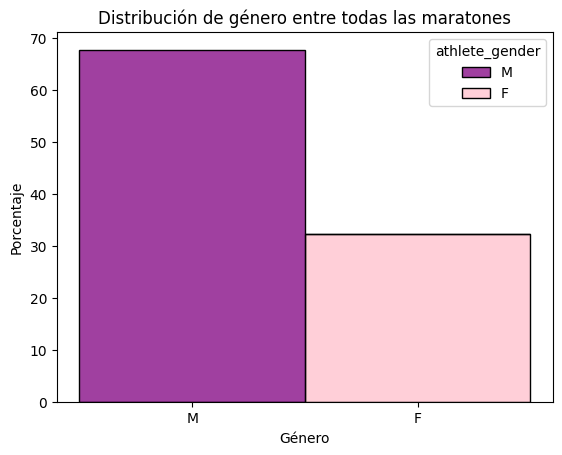

In [20]:
# Gráfica distribución de atletas por género

sns.histplot(df_renamed, x='athlete_gender', hue='athlete_gender', stat='percent', palette=['Purple', 'Pink'], multiple='stack')
plt.title('Distribución de género entre todas las maratones')
plt.xlabel('Género')
plt.ylabel('Porcentaje')
plt.show()

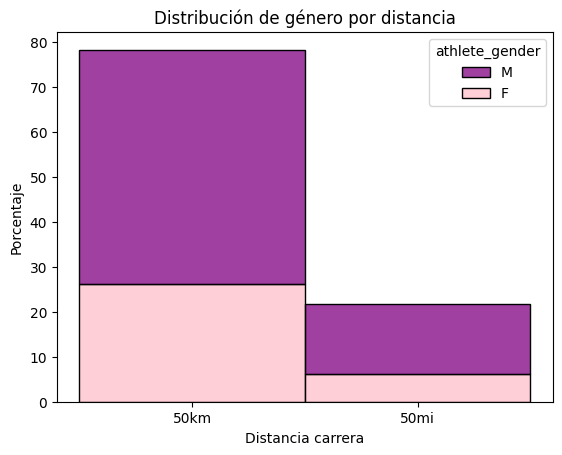

In [21]:
# Gráfica distribución de atletas por género y distancia

sns.histplot(df_renamed, x='race_distance',hue='athlete_gender', stat='percent', palette=['Purple', 'Pink'], multiple='stack')
plt.title('Distribución de género por distancia')
plt.xlabel('Distancia carrera')
plt.ylabel('Porcentaje')
plt.show()

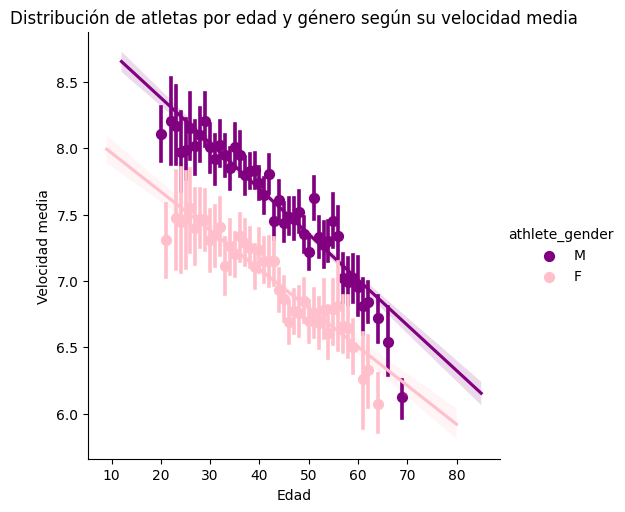

In [22]:
# Distribución de los atletas según su edad, género y velocidad media

sns.lmplot(data=df_renamed, x= 'athlete_age', y='athlete_avg_speed', hue='athlete_gender', palette=['Purple', 'Pink'], x_bins=100)
plt.title('Distribución de atletas por edad y género según su velocidad media')
plt.xlabel('Edad')
plt.ylabel('Velocidad media')
plt.show()

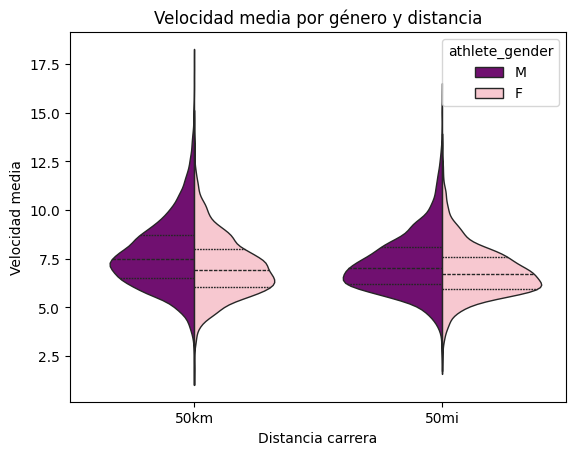

In [23]:
# Comparamos las distribuciones de las categorías: distancia de carrera, velocidad media del atleta y su género

sns.violinplot(data=df_renamed, x='race_distance', y='athlete_avg_speed', hue='athlete_gender', palette=['Purple', 'Pink'], split=True, inner='quart', linewidth=1)
plt.title('Velocidad media por género y distancia')
plt.xlabel('Distancia carrera')
plt.ylabel('Velocidad media')
plt.show()

In [24]:
df_renamed.groupby(['race_distance', 'athlete_gender'])['athlete_avg_speed'].agg(['mean', 'min', 'max']).sort_values('mean', ascending=False)

,,mean,min,max
race_distance,athlete_gender,,,
50km,M,7.738985,1.547,17.746
50mi,M,7.257633,2.170,15.930
50km,F,7.083011,1.541,14.614
50mi,F,6.834371,2.323,13.335


In [25]:
df_renamed.groupby(['race_distance', 'athlete_gender'])['athlete_avg_speed'].agg(['median']).sort_values('median', ascending=False)

,,median
race_distance,athlete_gender,
50km,M,7.503
50mi,M,7.011
50km,F,6.900
50mi,F,6.695


# **2. ¿Qué edades son las mejores y peores en la carrera "50mi"? (Solo personas mayores de 19 años).**

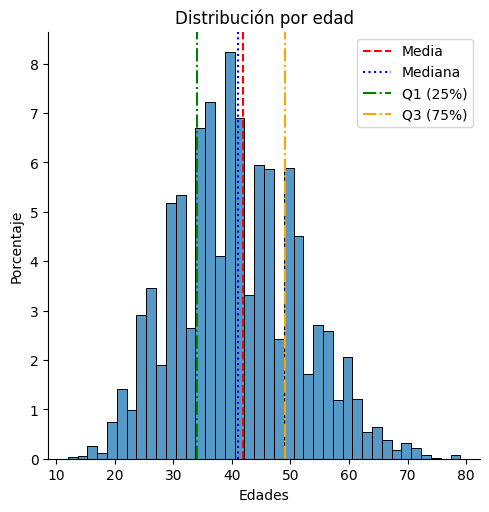

In [29]:
# Gráfica distribución por edad entre los atletas del dataFrame

g = sns.displot(df_renamed['race_distance' == "50mi"]['athlete_age'], stat='percent')

mean = df_renamed['athlete_age'].mean()
median = df_renamed['athlete_age'].median()
q25 = df_renamed['athlete_age'].quantile(0.25)
q75 = df_renamed['athlete_age'].quantile(0.75)

ax = g.ax

ax.axvline(mean, color='red', linestyle='dashed', label='Media')
ax.axvline(median, color='blue', linestyle='dotted', label='Mediana')
ax.axvline(q25, color='green', linestyle='dashdot', label='Q1 (25%)')
ax.axvline(q75, color='orange', linestyle='dashdot', label='Q3 (75%)')

plt.title('Distribución por edad')
plt.xlabel('Edades')
plt.ylabel('Porcentaje')
plt.legend()
plt.show()

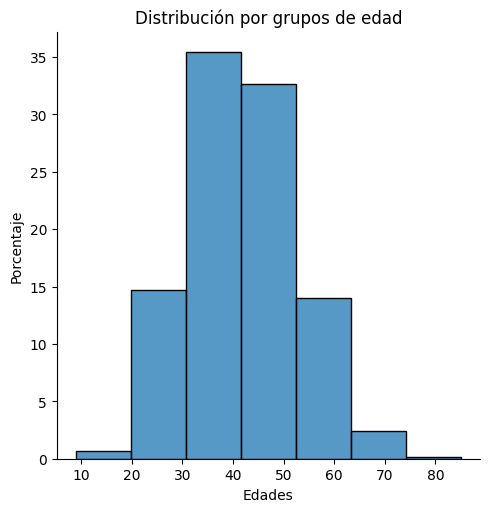

In [30]:
g = sns.displot(df_renamed['athlete_age'], stat='percent', binwidth=11)

plt.title('Distribución por grupos de edad')
plt.xlabel('Edades')
plt.ylabel('Porcentaje')
plt.show()

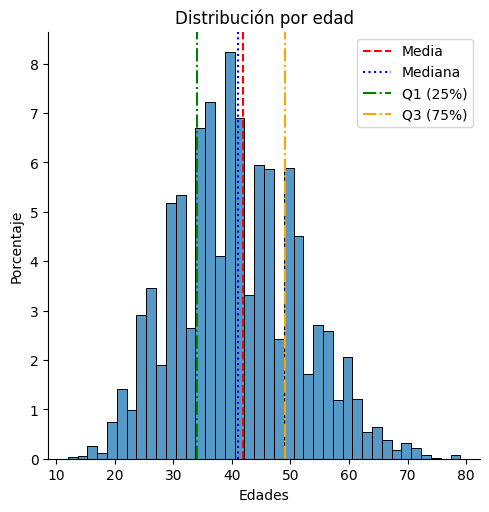

In [43]:
# Gráfica distribución por edad entre los atletas del dataFrame en la maratón 50mi

df_grafica = df_renamed.query('race_distance == "50mi"')['athlete_age']

g = sns.displot(df_grafica, stat='percent')

mean = df_renamed['athlete_age'].mean()
median = df_renamed['athlete_age'].median()
q25 = df_renamed['athlete_age'].quantile(0.25)
q75 = df_renamed['athlete_age'].quantile(0.75)

ax = g.ax

ax.axvline(mean, color='red', linestyle='dashed', label='Media')
ax.axvline(median, color='blue', linestyle='dotted', label='Mediana')
ax.axvline(q25, color='green', linestyle='dashdot', label='Q1 (25%)')
ax.axvline(q75, color='orange', linestyle='dashdot', label='Q3 (75%)')

plt.title('Distribución por edad')
plt.xlabel('Edades')
plt.ylabel('Porcentaje')
plt.legend()
plt.show()

In [31]:
df_renamed.query('race_distance == "50mi"').groupby('athlete_age')['athlete_avg_speed'].agg(['mean', 'count']).sort_values('mean', ascending=False).query('count > 19').head(15)

,mean,count
athlete_age,,
29.0,7.902252,135
23.0,7.779800,55
28.0,7.575252,107
30.0,7.569204,157
25.0,7.540923,91
31.0,7.451638,138
38.0,7.430022,231
35.0,7.422359,195
36.0,7.403854,185


In [48]:
df_renamed.query('race_distance == "50mi"').groupby('athlete_age')['athlete_avg_speed'].agg(['mean', 'count']).sort_values('mean', ascending=True).query('count > 19').head(15)

,mean,count
athlete_age,,
60.0,6.261788,33
62.0,6.272730,37
61.0,6.358355,31
63.0,6.514806,31
58.0,6.582328,67
64.0,6.620727,22
50.0,6.671541,172
59.0,6.672072,83
48.0,6.696853,136


# **3. ¿Son los corredores más lentos en verano que en invierno? Ver diferencia entre estaciones**

In [33]:
# Creamos la columna mes para dividir los registros entre estaciones

df_renamed['race_month'] = df_renamed['event_date'].astype(str).str.split('.').str[1].astype(int)

df_renamed.head(8)

,event_date,event_name,race_distance,race_number_finishers,athlete_ID,athlete_gender,athlete_age,athlete_performance,athlete_avg_speed,race_month
2539945,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,71287,M,29.0,3:17:55,15.158,2
2539946,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,629508,M,39.0,4:02:32,12.369,2
2539947,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,64838,M,21.0,4:07:57,12.099,2
2539948,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,704450,M,37.0,4:22:02,11.449,2
2539949,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,810281,M,43.0,4:27:34,11.212,2
2539950,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,810282,F,35.0,4:42:06,10.635,2
2539951,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,11739,M,59.0,4:49:20,10.369,2
2539952,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,80394,M,50.0,4:49:50,10.351,2


In [34]:
# Creamos la columna estación y agrupamos según el mes

df_renamed['race_season'] = df_renamed['race_month'].apply(lambda x : "Winter" if x > 11 else "Fall" if x > 8 else "Summer" if x > 5 else "Spring" if x > 2 else "Winter")

df_renamed.head(8)

,event_date,event_name,race_distance,race_number_finishers,athlete_ID,athlete_gender,athlete_age,athlete_performance,athlete_avg_speed,race_month,race_season
2539945,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,71287,M,29.0,3:17:55,15.158,2,Winter
2539946,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,629508,M,39.0,4:02:32,12.369,2,Winter
2539947,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,64838,M,21.0,4:07:57,12.099,2,Winter
2539948,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,704450,M,37.0,4:22:02,11.449,2,Winter
2539949,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,810281,M,43.0,4:27:34,11.212,2,Winter
2539950,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,810282,F,35.0,4:42:06,10.635,2,Winter
2539951,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,11739,M,59.0,4:49:20,10.369,2,Winter
2539952,02.02.2020,West Seattle Beach Run - Winter Edition,50km,20,80394,M,50.0,4:49:50,10.351,2,Winter


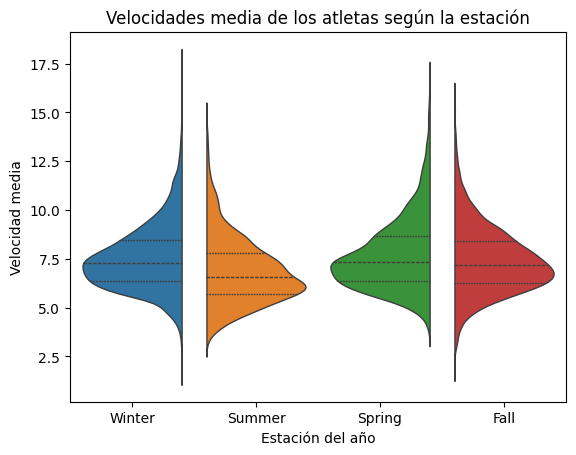

In [35]:
sns.violinplot(data=df_renamed, x='race_season', y='athlete_avg_speed', hue='race_season', split=True, inner='quart', linewidth=1).set_title('Velocidades media de los atletas según la estación')
plt.xlabel('Estación del año')
plt.ylabel('Velocidad media')
plt.show()

In [36]:
df_renamed.groupby('race_season')['athlete_avg_speed'].apply(lambda x: x.mode().iat[0]).sort_values(ascending=False)

,athlete_avg_speed
race_season,
Fall,7.299
Winter,6.818
Summer,5.917
Spring,5.866


In [37]:
df_renamed.groupby('race_season')['athlete_avg_speed'].agg(['mean', 'count']).sort_values('mean', ascending=False)

,mean,count
race_season,,
Spring,7.684430,3294
Winter,7.518187,11595
Fall,7.406619,8315
Summer,6.869336,2653


In [38]:
df_renamed.groupby(['race_season', 'race_distance'])['athlete_avg_speed'].agg(['median', 'count']).sort_values('median', ascending=False)

median  count
race_season race_distance               
Spring      50km           7.5250   2458
Winter      50km           7.3880   9618
Fall        50mi           7.2400   1997
            50km           7.1860   6318
Winter      50mi           6.8870   1977
Summer      50km           6.8105   1836
Spring      50mi           6.7865    836
Summer      50mi           6.2720    817

# **Otras observaciones**

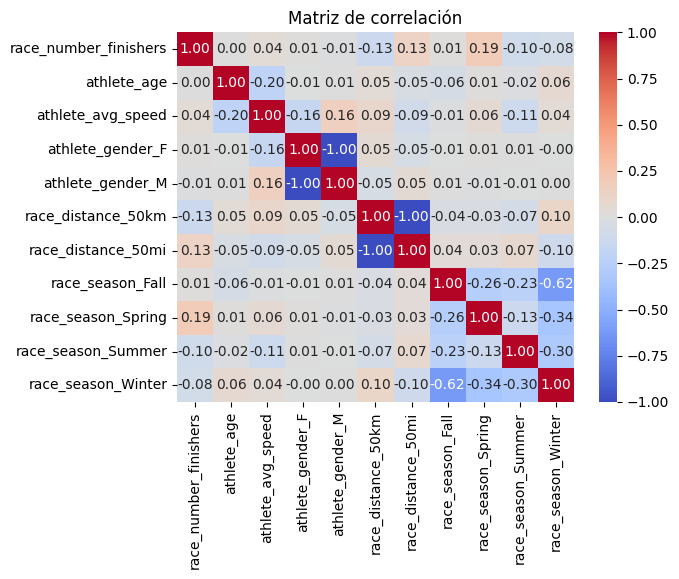

In [39]:
# Vemos de nuevo las correlaciones a partir del heatmap con las columnas del nuevo dataFrame

aux = pd.get_dummies(df_renamed[['athlete_gender', 'race_distance', 'race_season']])
aux1 = df_renamed.drop(columns=['athlete_gender', 'race_distance', 'athlete_ID', 'race_month', 'race_season'])
df_corr = pd.concat([aux1, aux], axis=1)

matriz_correlacion = df_corr.corr(numeric_only=True)

sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de correlación')
plt.show()

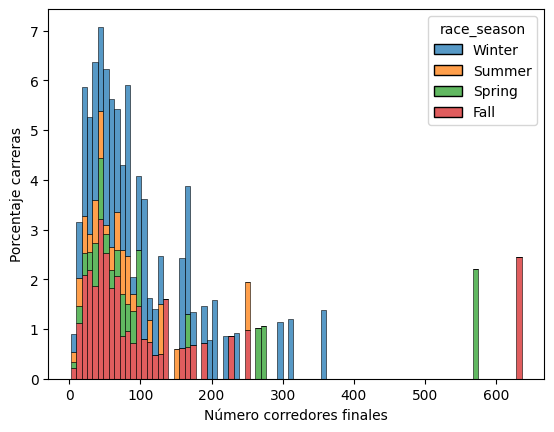

In [59]:
# Distribución de carreras por estación según el número de corredores que acabaron la maratón

sns.histplot(df_renamed, x='race_number_finishers',hue='race_season', stat='percent', multiple='stack')

plt.xlabel('Número corredores finales')
plt.ylabel('Porcentaje carreras')
plt.show()

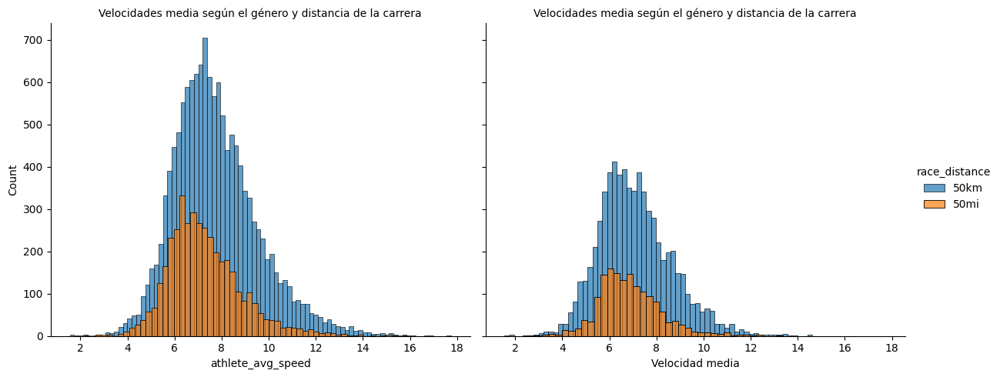

In [41]:
# Se muestra en un gráfico las velocidades medias por tipo de carrera y género del atleta
# Es el mismo que el gráfico violín de la primera pregunta pero superpuesta la información por género

g = sns.FacetGrid(df_renamed, col="athlete_gender", hue="race_distance", height=5, aspect=1.2).set_titles('Velocidades media según el género y distancia de la carrera')
g.map(sns.histplot, "athlete_avg_speed", alpha=0.7, multiple="stack")
g.add_legend()

plt.xlabel('Velocidad media')
plt.ylabel('Número de atletas')
plt.show()

In [50]:
# Agrupamos los datos por evento y género para comprobar la velocidad media. Añadimos la columna "race_distance" para sacar otras relaciones.
# Los números de participantes son tan pequeños que no vale la pena explorarlos

df_renamed.groupby(['event_name', 'athlete_gender']).agg(race_distance=('race_distance', 'first'), mean_speed=('athlete_avg_speed', 'mean'), count=('athlete_avg_speed', 'count')).sort_values('mean_speed', ascending=False)

race_distance  \
event_name                                    athlete_gender                 
Caumsett Park 50K Lloyd Neck - Championships  M                       50km   
                                              F                       50km   
Jed Smith Ultra Classic - 50 Mile Race        F                       50mi   
USATF National Championships Santee           M                       50km   
Pullman Winter Ultra 50K                      M                       50km   
...                                                                    ...   
Outlaw 100 Oklahoma - 50 Mile Run             M                       50mi   
The Barkley Fall Classic                      F                       50km   
Midwest Everest 50 Mile Race                  M                       50mi   
Fuzzy Fandango Trail Races                    M                       50km   
                                              F                       50km   

                                                              mean_speed  \
event_name                                    athlete_gender               
Caumsett Park 50K Lloyd Neck - Championships  M                11.590375   
                                              F                10.597929   
Jed Smith Ultra Classic - 50 Mile Race        F                10.590000   
USATF National Championships Santee           M                10.484222   
Pullman Winter Ultra 50K                      M                10.422000   
...                                                                  ...   
Outlaw 100 Oklahoma - 50 Mile Run             M                 4.426364   
The Barkley Fall Classic                      F                 4.365818   
Midwest Everest 50 Mile Race                  M                 3.998500   
Fuzzy Fandango Trail Races                    M                 3.636742   
                                              F                 3.356000   

                                                              count  
event_name                                    athlete_gender         
Caumsett Park 50K Lloyd Neck - Championships  M                  32  
                                              F                  14  
Jed Smith Ultra Classic - 50 Mile Race        F                   3  
USATF National Championships Santee           M                   9  
Pullman Winter Ultra 50K                      M                   3  
...                                                             ...  
Outlaw 100 Oklahoma - 50 Mile Run             M                  11  
The Barkley Fall Classic                      F                  22  
Midwest Everest 50 Mile Race                  M                   2  
Fuzzy Fandango Trail Races                    M                  31  
                                              F                  22  

[968 rows x 3 columns]

In [42]:
# Se guarda una copia del dataset para correlaciones y ML

df_corr.to_csv('UM_RACES_CORR.csv', index=False)   # index false para que no añada una columna de indice
print("Archivo exportado")

Archivo exportado
